In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

import geopandas as gpd
import contextily as ctx
from shapely.geometry import Point
from networkx.readwrite import json_graph
import json

In [2]:
df= pd.read_csv('../data/ka2_mobility_data_cleaned.csv')

In [3]:
df.head()

,Mobility Year,Mobility StartMonth,Activity (mob),Special Needs,Fewer Opportunities,Disadvantaged Background,Sending Country,Sending Organization,Receiving Country,Receiving Organization,Actual Participants (Contracted Projects)
0,2014,9,Short-term exchanges of groups of pupils,N,N,N,DE - Germany,sekundarschule friedrich ludwig jahn freyburg,ES - Spain,colegio san pelayo,4
1,2014,9,Short-term exchanges of groups of pupils,N,N,N,DE - Germany,sekundarschule friedrich ludwig jahn freyburg,ES - Spain,colegio san pelayo,2
2,2014,9,Short-term exchanges of groups of pupils,N,N,N,DE - Germany,sekundarschule friedrich ludwig jahn freyburg,ES - Spain,colegio san pelayo,1
3,2015,2,Short-term exchanges of groups of pupils,N,N,N,AT - Austria,musik nms freistadt,DE - Germany,sekundarschule friedrich ludwig jahn freyburg,5
4,2015,2,Short-term exchanges of groups of pupils,N,N,N,AT - Austria,musik nms freistadt,DE - Germany,sekundarschule friedrich ludwig jahn freyburg,5


In [4]:
def create_network(df, year="all", extra_data_file="../data/country_extra_data.csv"):
    '''
    Creates a directed graph from mobility data
    Nodes: countries, each node has attributes from extra data file (language family, economic family, geographical cultural region, lat, lon)
    Edges: directed from sending country to receiving country, weighted by number of participants (edge weight = sum of participants for all mobilities from sending to receiving country) 
    Edge metadata: sender organization, receiver organization, start month, activity type, special needs, fewer opportunities, disadvantaged background (all as counts: how many mobilities from sending to receiving country had this attribute)
    
    examples:
    node: 'LI - Liechtenstein': {'language_family': '1,3', 'economic_family': 'Advanced_Economy', 'geographical_cultural_region': 'West', 'lat': 47.166, 'lon': 9.5554}}
    edge: Edge from LI - Liechtenstein to NL - Netherlands: {'weight': 1, 'metadata': {'sender_org': {'istituto statale di istruzione secondaria superiore "p.gobetti a.volta"': 1}, 'receiver_org': {"'t atrium": 1}, 'start_months': {2: 1}, 'activity': {'Short-term exchanges of groups of pupils': 1}, 'special_needs': {'N': 1}, 'fewer_opportunities': {'N': 1}, 'disadvantaged_background': {'N': 1}}}
    '''
    
    if year != "all":
        df = df[df['Mobility Year'] == year]
    
    G = nx.DiGraph()
    # add nodes and node info from extra data file
    # Country,Language_Family,Economic_Family,Geographical_Cultural_Region,lat,lon
    extra_data = pd.read_csv(extra_data_file)
    for _, row in extra_data.iterrows():
        country = row['Country']
        language_family = row['Language_Family']
        economic_family = row['Economic_Family']
        geographical_cultural_region = row['Geographical_Cultural_Region']
        lat, lon = row['lat'], row['lon']
        G.add_node(country, language_family=language_family, economic_family=economic_family, geographical_cultural_region=geographical_cultural_region, lat=lat, lon=lon)
    
    for _, row in df.iterrows():
        sending_node = row['Sending Country']
        receiving_node = row['Receiving Country']

        sender_org = row['Sending Organization']
        receiver_org = row['Receiving Organization']
        participants = row['Actual Participants (Contracted Projects)']
        start_month = row['Mobility StartMonth']
        activity = row['Activity (mob)']
        special_needs = row['Special Needs']
        fewer_opportunities = row['Fewer Opportunities']
        disadvantaged_background = row['Disadvantaged Background']


        empty_data = {
            'sender_org': {sender_org: 1},
            'receiver_org': {receiver_org: 1},
            'start_months': {start_month: 1},
            'activity': {activity: 1},
            'special_needs': {special_needs: 1},
            'fewer_opportunities': {fewer_opportunities: 1},
            'disadvantaged_background': {disadvantaged_background: 1}
        }
        
        if G.has_edge(sending_node, receiving_node):
            G[sending_node][receiving_node]['weight'] += participants
            # Update metadata
            G[sending_node][receiving_node]['metadata']['sender_org'][sender_org] = G[sending_node][receiving_node]['metadata']['sender_org'].get(sender_org, 0) + 1
            G[sending_node][receiving_node]['metadata']['receiver_org'][receiver_org] = G[sending_node][receiving_node]['metadata']['receiver_org'].get(receiver_org, 0) + 1
            G[sending_node][receiving_node]['metadata']['start_months'][start_month] = G[sending_node][receiving_node]['metadata']['start_months'].get(start_month, 0) + 1
            G[sending_node][receiving_node]['metadata']['activity'][activity] = G[sending_node][receiving_node]['metadata']['activity'].get(activity, 0) + 1
            G[sending_node][receiving_node]['metadata']['special_needs'][special_needs] = G[sending_node][receiving_node]['metadata']['special_needs'].get(special_needs, 0) + 1
            G[sending_node][receiving_node]['metadata']['fewer_opportunities'][fewer_opportunities] = G[sending_node][receiving_node]['metadata']['fewer_opportunities'].get(fewer_opportunities, 0) + 1
            G[sending_node][receiving_node]['metadata']['disadvantaged_background'][disadvantaged_background] = G[sending_node][receiving_node]['metadata']['disadvantaged_background'].get(disadvantaged_background, 0) + 1
        else:
            G.add_edge(sending_node, receiving_node, weight=participants, metadata=empty_data)
    
    return G

# Write graph objects

In [8]:
years = list(df['Mobility Year'].unique())
years.append("all")

for year in years:
    G = create_network(df, year=year)
    data = json_graph.node_link_data(G)
    with open(f'../data/ka2_graphs/ka2_mobility_network_{year}.json', 'w') as f:
        json.dump(data, f, indent=2)

# Read graph objects

Graph for year 2014:
Number of nodes: 39
Number of edges: 170


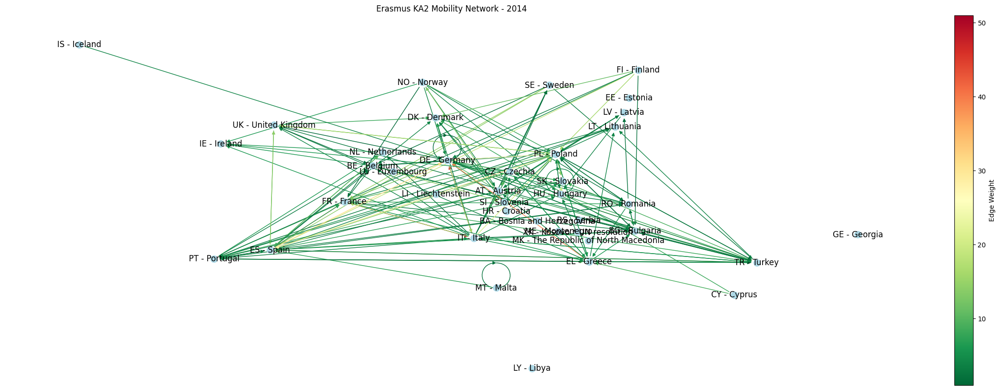

Graph for year 2015:
Number of nodes: 39
Number of edges: 703


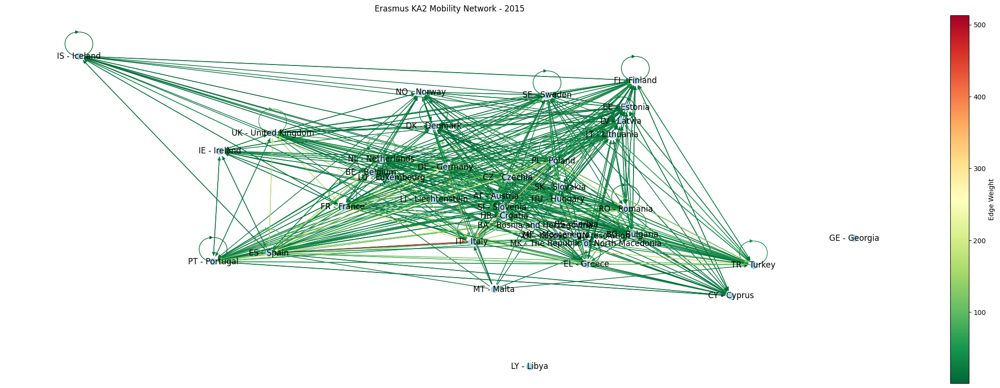

Graph for year 2016:
Number of nodes: 39
Number of edges: 816


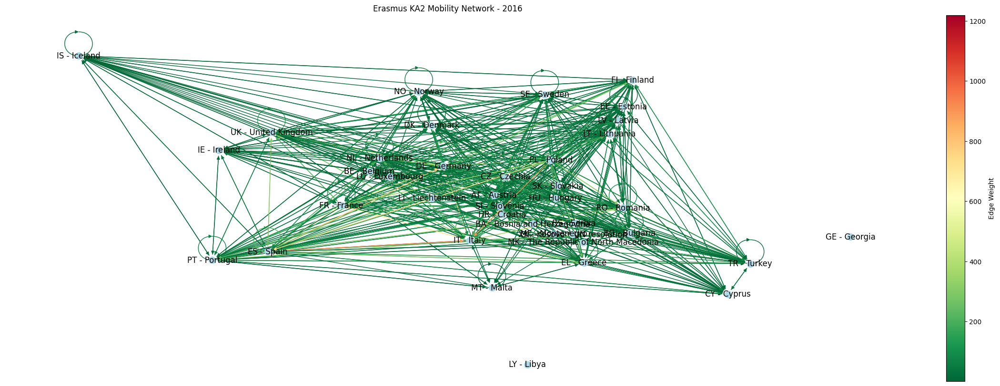

Graph for year 2017:
Number of nodes: 39
Number of edges: 883


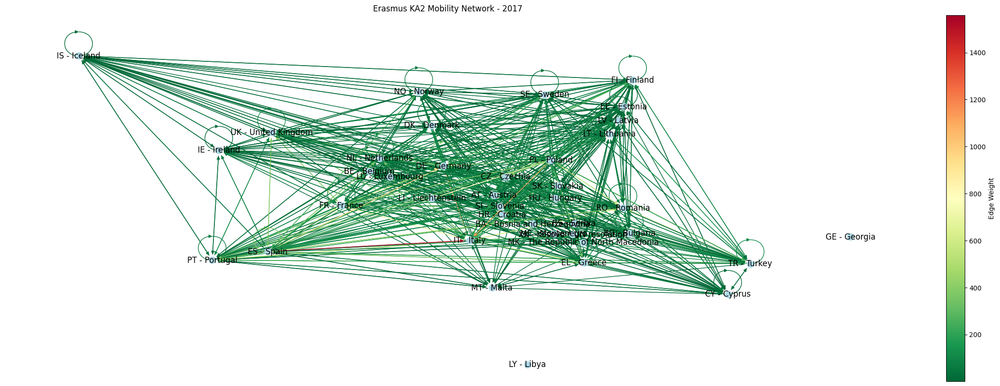

Graph for year 2018:
Number of nodes: 39
Number of edges: 915


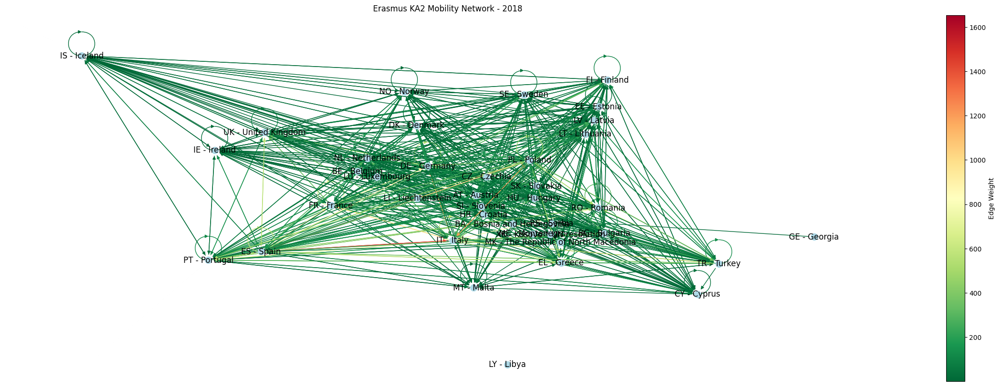

Graph for year 2019:
Number of nodes: 39
Number of edges: 956


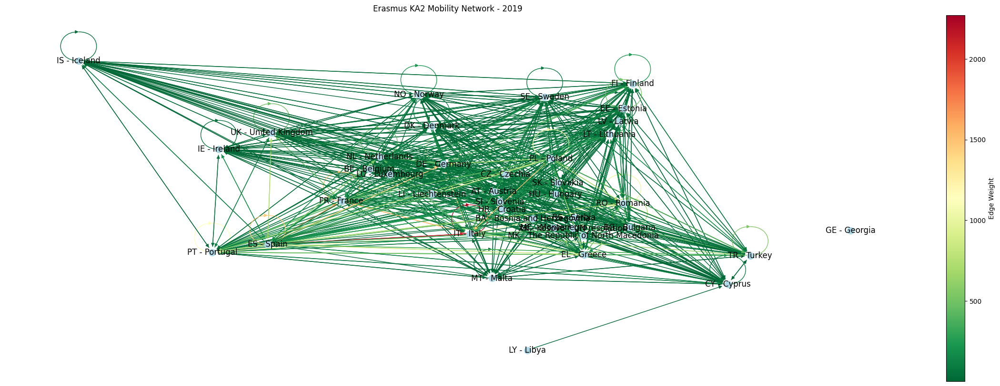

Graph for year 2020:
Number of nodes: 39
Number of edges: 822


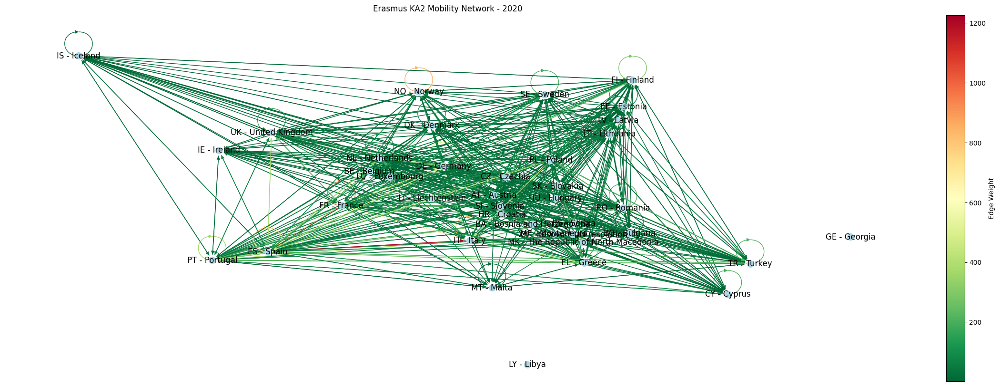

Graph for year 2021:
Number of nodes: 39
Number of edges: 814


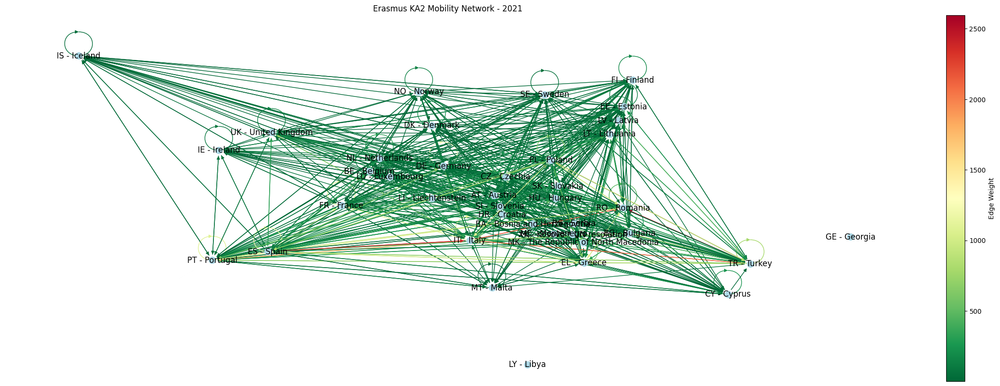

Graph for year 2022:
Number of nodes: 39
Number of edges: 999


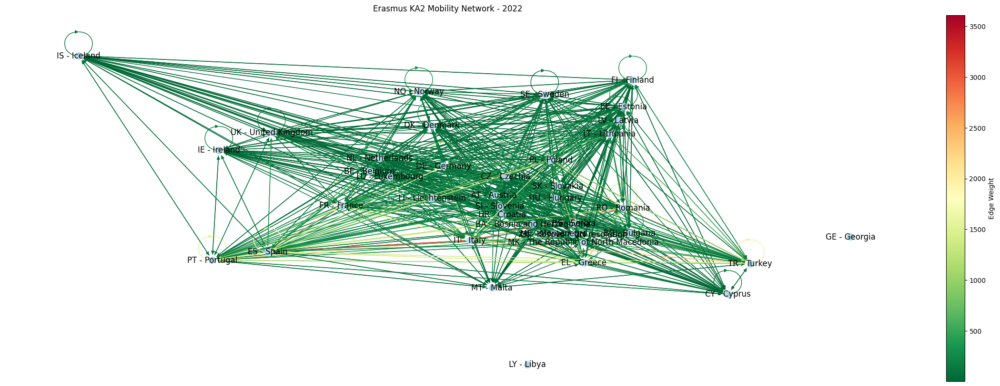

Graph for year 2023:
Number of nodes: 39
Number of edges: 837


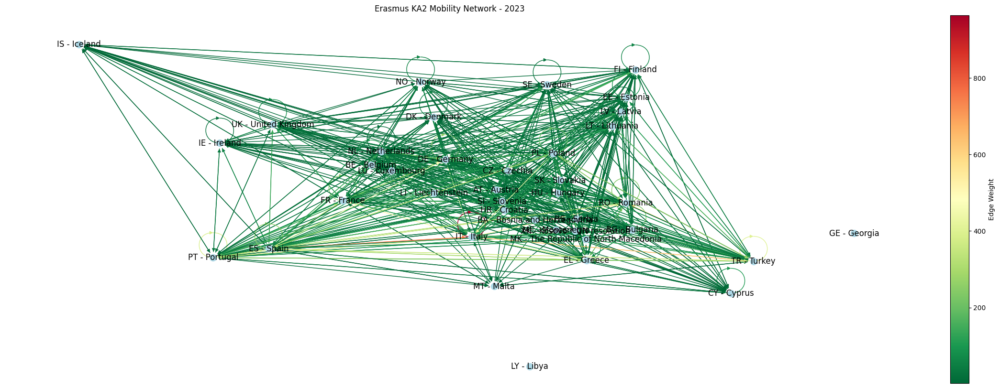

Graph for year all:
Number of nodes: 39
Number of edges: 1090


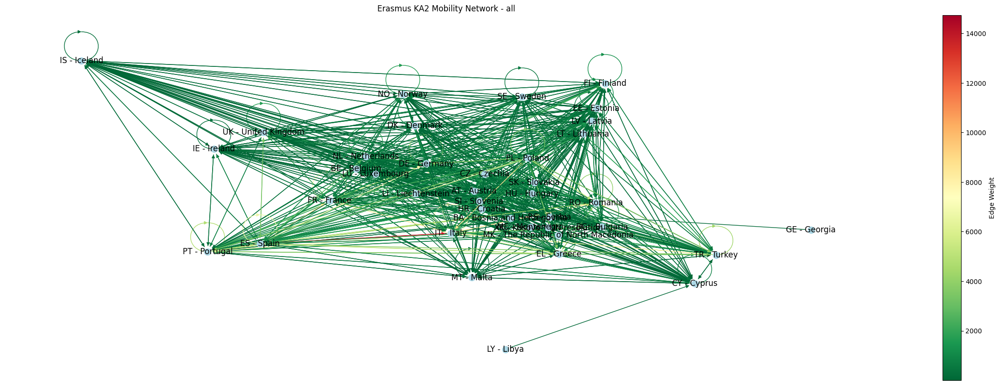

In [14]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

for year in years:
    with open(f'../data/ka2_graphs/ka2_mobility_network_{year}.json', 'r') as f:
        data = json.load(f)
        G = json_graph.node_link_graph(data)
        print(f"Graph for year {year}:")
        print(f"Number of nodes: {G.number_of_nodes()}")
        print(f"Number of edges: {G.number_of_edges()}")
        
        # plot graph
        fig, ax = plt.subplots(figsize=(30, 10))
        pos = {node: (G.nodes[node]['lon'], G.nodes[node]['lat']) for node in G.nodes()}
        weights = [G[u][v]['weight'] for u, v in G.edges()]
        norm = mcolors.Normalize(vmin=min(weights),vmax=max(weights))
        nx.draw_networkx_nodes(G,pos,node_size=100,node_color='lightblue', ax=ax)
        edges = nx.draw_networkx_edges(G,pos,edge_color=weights,
            edge_cmap=cm.RdYlGn_r,   # green -> yellow -> red
            edge_vmin=min(weights),edge_vmax=max(weights),width=1, ax=ax)
        nx.draw_networkx_labels(G, pos, ax=ax)
        sm = cm.ScalarMappable(norm=norm,cmap=cm.RdYlGn_r)
        sm.set_array([])

        plt.colorbar(sm, label='Edge Weight', ax=ax)

        plt.title(f"Erasmus KA2 Mobility Network - {year}")
        plt.axis('off')
        plt.show()


# Exploration

In [14]:
graph = create_network(df, year="all")
print(f"Number of nodes: {graph.number_of_nodes()}")
print(f"Number of edges: {graph.number_of_edges()}")

Number of nodes: 39
Number of edges: 1090


In [16]:
graph.nodes(data=True)

NodeDataView({'GE - Georgia': {'language_family': '14', 'economic_family': 'Emerging_Market', 'geographical_cultural_region': 'Other', 'lat': 42.3154, 'lon': 43.3569}, 'LU - Luxembourg': {'language_family': '1,3,4', 'economic_family': 'Advanced_Economy', 'geographical_cultural_region': 'West', 'lat': 49.8153, 'lon': 6.1296}, 'RO - Romania': {'language_family': '4', 'economic_family': 'Emerging_Market', 'geographical_cultural_region': 'Central/East', 'lat': 45.9432, 'lon': 24.9668}, 'PT - Portugal': {'language_family': '4', 'economic_family': 'Advanced_Economy', 'geographical_cultural_region': 'South', 'lat': 39.3999, 'lon': -8.2245}, 'SE - Sweden': {'language_family': '1,2', 'economic_family': 'Advanced_Economy', 'geographical_cultural_region': 'North', 'lat': 60.1282, 'lon': 18.6435}, 'NO - Norway': {'language_family': '1,2', 'economic_family': 'Advanced_Economy', 'geographical_cultural_region': 'North', 'lat': 60.472, 'lon': 8.4689}, 'UK - United Kingdom': {'language_family': '1,3', 

In [15]:
for node1 in graph.nodes(data=True):
    for node2 in graph.nodes(data=True):
        if node1 != node2 and node1[0] < node2[0]:  # to avoid duplicate pairs
            print(f"Edge weight from {node1[0]} to {node2[0]}: {graph.get_edge_data(node1[0], node2[0])}")
            print(f"Edge weight from {node2[0]} to {node1[0]}: {graph.get_edge_data(node2[0], node1[0])}")
    

Edge weight from GE - Georgia to LU - Luxembourg: None
Edge weight from LU - Luxembourg to GE - Georgia: None
Edge weight from GE - Georgia to RO - Romania: None
Edge weight from RO - Romania to GE - Georgia: None
Edge weight from GE - Georgia to PT - Portugal: None
Edge weight from PT - Portugal to GE - Georgia: None
Edge weight from GE - Georgia to SE - Sweden: None
Edge weight from SE - Sweden to GE - Georgia: None
Edge weight from GE - Georgia to NO - Norway: None
Edge weight from NO - Norway to GE - Georgia: None
Edge weight from GE - Georgia to UK - United Kingdom: None
Edge weight from UK - United Kingdom to GE - Georgia: None
Edge weight from GE - Georgia to SI - Slovenia: None
Edge weight from SI - Slovenia to GE - Georgia: None
Edge weight from GE - Georgia to MT - Malta: None
Edge weight from MT - Malta to GE - Georgia: None
Edge weight from GE - Georgia to LV - Latvia: None
Edge weight from LV - Latvia to GE - Georgia: None
Edge weight from GE - Georgia to RS - Serbia: None

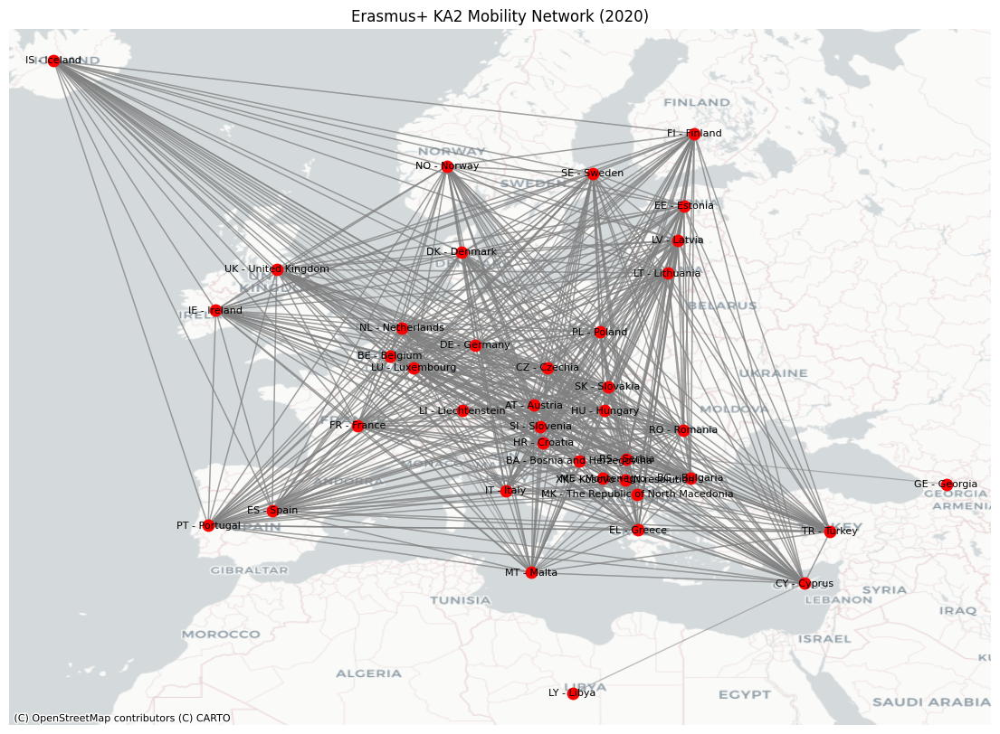

In [26]:


# Create geographic positions
pos = {node: (data['lon'], data['lat']) for node, data in graph.nodes(data=True)}

# Convert nodes to GeoDataFrame
nodes = []
for node, data in graph.nodes(data=True):
    nodes.append({
        'node': node,
        'geometry': Point(data['lon'], data['lat'])
    })

gdf = gpd.GeoDataFrame(nodes, crs="EPSG:4326")

# Convert to Web Mercator for map tiles
gdf = gdf.to_crs(epsg=3857)

# Update positions after projection
projected_pos = {row['node']: (row.geometry.x, row.geometry.y)for _, row in gdf.iterrows()}

# Create figure
fig, ax = plt.subplots(figsize=(14, 10))

# Draw edges
for u, v in graph.edges():
    x1, y1 = projected_pos[u]
    x2, y2 = projected_pos[v]

    ax.plot(
        [x1, x2],
        [y1, y2],
        color='gray',
        alpha=0.5,
        linewidth=1,
    )

# Draw nodes
nx.draw_networkx_nodes(
    graph,
    projected_pos,
    node_size=80,
    node_color='red',
    ax=ax
)

# Draw labels
nx.draw_networkx_labels(
    graph,
    projected_pos,
    font_size=8,
    ax=ax
)

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

ax.set_axis_off()
plt.title("Erasmus+ KA2 Mobility Network (2020)")
plt.show()